In [1]:
# Importing relevant modules.

import random
import numpy as np
import matplotlib.pyplot as plt
from pycocotools.coco import COCO  # API for COCO dataset.
import skimage.io as io
import tensorflow as tf
from tensorflow import keras
from keras import Model, layers
from tensorflow.keras.layers import Input, Conv2D, MaxPooling2D, UpSampling2D, concatenate

%matplotlib inline

In [2]:
# Import and mount Google Drive.

from google.colab import drive
drive.mount("/content/drive")

Mounted at /content/drive


In [3]:
# Unzip the dataset file and store it in a folder called images.

!unzip "/content/drive/MyDrive/Research Methods/Assignment_1/RM_Segmentation_Assignment_dataset.zip" -d "/content/coco2017/"

Archive:  /content/drive/MyDrive/Research Methods/Assignment_1/RM_Segmentation_Assignment_dataset.zip
  inflating: /content/coco2017/test-30/000000001751.jpg  
  inflating: /content/coco2017/test-30/000000001380.jpg  
  inflating: /content/coco2017/test-30/000000001643.jpg  
  inflating: /content/coco2017/test-30/000000001583.jpg  
  inflating: /content/coco2017/test-30/000000001685.jpg  
  inflating: /content/coco2017/test-30/000000001482.jpg  
  inflating: /content/coco2017/test-30/000000001494.jpg  
  inflating: /content/coco2017/test-30/000000001551.jpg  
  inflating: /content/coco2017/test-30/000000001654.jpg  
  inflating: /content/coco2017/test-30/000000001594.jpg  
  inflating: /content/coco2017/test-30/000000001411.jpg  
  inflating: /content/coco2017/test-30/000000001459.jpg  
  inflating: /content/coco2017/test-30/000000001410.jpg  
  inflating: /content/coco2017/test-30/000000001717.jpg  
  inflating: /content/coco2017/test-30/000000001730.jpg  
  inflating: /content/coco20

In [4]:
# Define location of training data (images and labels).
train_data_path = "/content/coco2017/train-300"
train_annotation_file = f"{train_data_path}/labels.json"

# Define location of validation data (images and labels).
val_data_path = "/content/coco2017/validation-300"
val_annotation_file = f"{val_data_path}/labels.json"

# Define location of test data (images)
test_data_path = "/content/coco2017/test-30"

In [5]:
# Initialising COCO API for training instance annotations.
coco_train = COCO(train_annotation_file)

# Initialising COCO API for validation instance annotations.
coco_val = COCO(val_annotation_file)

loading annotations into memory...
Done (t=0.04s)
creating index...
index created!
loading annotations into memory...
Done (t=0.24s)
creating index...
index created!


Images in downloaded train folder: 300
Images in downloaded validation folder: 300
Images in downloaded test folder: 30

Images in training dataset: 300
Images in validation dataset: 300
Images in test dataset: 30

Training dataset category counts:
airplane: 15
backpack: 84
banana: 15
baseball bat: 6
baseball glove: 12
bear: 3
bench: 49
bicycle: 125
bird: 57
boat: 20
book: 2
bottle: 10
bowl: 10
broccoli: 1
bus: 91
cake: 13
car: 1061
carrot: 4
cat: 4
cell phone: 19
chair: 51
clock: 17
cow: 1
cup: 21
dining table: 25
dog: 14
donut: 4
elephant: 5
fire hydrant: 9
fork: 6
frisbee: 3
giraffe: 1
handbag: 72
horse: 17
hot dog: 3
kite: 55
knife: 4
laptop: 2
motorcycle: 73
oven: 2
parking meter: 9
person: 1350
pizza: 10
potted plant: 9
refrigerator: 2
remote: 1
sandwich: 6
scissors: 2
skateboard: 30
skis: 11
spoon: 1
sports ball: 23
stop sign: 14
suitcase: 14
surfboard: 15
tennis racket: 7
tie: 12
traffic light: 167
train: 10
truck: 120
umbrella: 68
vase: 1
wine glass: 2

Validation dataset cate

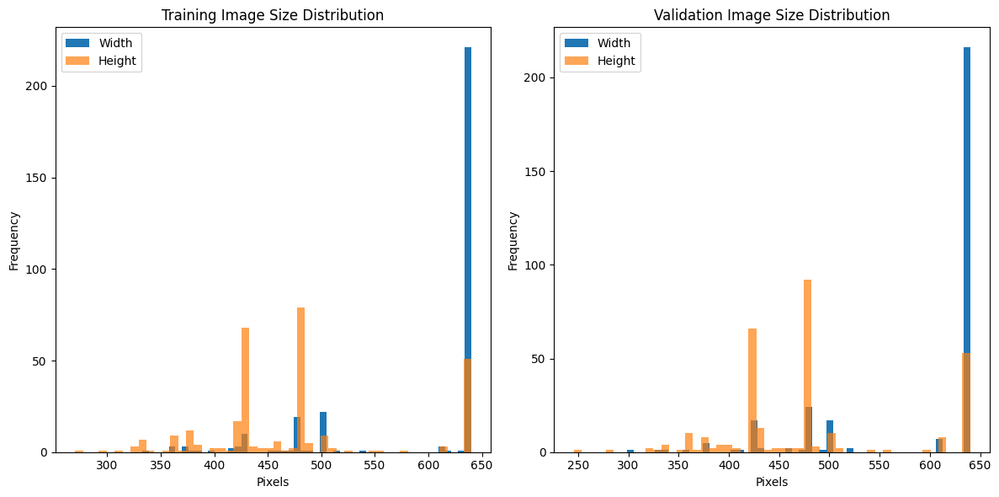

In [6]:
# How many images are in the downloaded data folders?
# How many images are in our training/validation/test datasets?
# How often does each COCO/target class appear?
# How large are the images? What is their distribution?

import numpy as np
import os

# Count images in downloaded data folders
def count_images_in_folder(folder_path):
    image_extensions = ['.jpg', '.jpeg', '.png']  # Add other extensions if needed
    count = 0
    if os.path.exists(folder_path):
        for filename in os.listdir(folder_path):
            if any(filename.lower().endswith(ext) for ext in image_extensions):
                count += 1
    return count

train_downloaded_images = count_images_in_folder(os.path.join('/content/coco2017/', 'train-300/data'))
val_downloaded_images = count_images_in_folder(os.path.join('/content/coco2017/', 'validation-300/data'))
test_downloaded_images = count_images_in_folder(os.path.join('/content/coco2017/', 'test-30'))

print(f"Images in downloaded train folder: {train_downloaded_images}")
print(f"Images in downloaded validation folder: {val_downloaded_images}")
print(f"Images in downloaded test folder: {test_downloaded_images}")


# Count images in training/validation/test datasets (assuming these paths are correct after unzipping)
train_dataset_images = count_images_in_folder(f'{train_data_path}/data')
val_dataset_images = count_images_in_folder(f'{val_data_path}/data')
test_dataset_images = count_images_in_folder(test_data_path)

print(f"\nImages in training dataset: {train_dataset_images}")
print(f"Images in validation dataset: {val_dataset_images}")
print(f"Images in test dataset: {test_dataset_images}")

# How often does each COCO/target class appear?
# Get all category ids and names
cats = coco_train.loadCats(coco_train.getCatIds())
cat_names = [cat['name'] for cat in cats]

# Count annotations per category for training data
train_cat_counts = {}
for cat_name in cat_names:
    cat_id = coco_train.getCatIds(catNms=[cat_name])
    img_ids = coco_train.getImgIds(catIds=cat_id)
    ann_ids = coco_train.getAnnIds(imgIds=img_ids, catIds=cat_id)
    train_cat_counts[cat_name] = len(ann_ids)

print("\nTraining dataset category counts:")
for cat, count in train_cat_counts.items():
    print(f"{cat}: {count}")

# Count annotations per category for validation data
val_cat_counts = {}
for cat_name in cat_names:
    cat_id = coco_val.getCatIds(catNms=[cat_name])
    img_ids = coco_val.getImgIds(catIds=cat_id)
    ann_ids = coco_val.getAnnIds(imgIds=img_ids, catIds=cat_id)
    val_cat_counts[cat_name] = len(ann_ids)

print("\nValidation dataset category counts:")
for cat, count in val_cat_counts.items():
    print(f"{cat}: {count}")

# How large are the images? What is their distribution?
# Get image sizes from the training dataset
img_ids_train = coco_train.getImgIds()
img_sizes_train = []
for img_id in img_ids_train:
    img_info = coco_train.loadImgs(img_id)[0]
    img_sizes_train.append((img_info['width'], img_info['height']))

# Get image sizes from the validation dataset
img_ids_val = coco_val.getImgIds()
img_sizes_val = []
for img_id in img_ids_val:
    img_info = coco_val.loadImgs(img_id)[0]
    img_sizes_val.append((img_info['width'], img_info['height']))

# Convert sizes to numpy arrays for easier analysis
img_sizes_train = np.array(img_sizes_train)
img_sizes_val = np.array(img_sizes_val)

print("\nTraining dataset image size statistics:")
print(f"Number of images: {len(img_sizes_train)}")
print(f"Mean size (width, height): {np.mean(img_sizes_train, axis=0)}")
print(f"Median size (width, height): {np.median(img_sizes_train, axis=0)}")
print(f"Min size (width, height): {np.min(img_sizes_train, axis=0)}")
print(f"Max size (width, height): {np.max(img_sizes_train, axis=0)}")

print("\nValidation dataset image size statistics:")
print(f"Number of images: {len(img_sizes_val)}")
print(f"Mean size (width, height): {np.mean(img_sizes_val, axis=0)}")
print(f"Median size (width, height): {np.median(img_sizes_val, axis=0)}")
print(f"Min size (width, height): {np.min(img_sizes_val, axis=0)}")
print(f"Max size (width, height): {np.max(img_sizes_val, axis=0)}")

# Plot distributions (optional but helpful)
plt.figure(figsize=(12, 6))

plt.subplot(1, 2, 1)
plt.hist(img_sizes_train[:, 0], bins=50, label='Width')
plt.hist(img_sizes_train[:, 1], bins=50, label='Height', alpha=0.7)
plt.title('Training Image Size Distribution')
plt.xlabel('Pixels')
plt.ylabel('Frequency')
plt.legend()

plt.subplot(1, 2, 2)
plt.hist(img_sizes_val[:, 0], bins=50, label='Width')
plt.hist(img_sizes_val[:, 1], bins=50, label='Height', alpha=0.7)
plt.title('Validation Image Size Distribution')
plt.xlabel('Pixels')
plt.ylabel('Frequency')
plt.legend()

plt.tight_layout()
plt.show()


In [7]:
import pandas as pd
filtered_classes = ["person", "cake", "dog", "car"]

# Create a DataFrame for training category counts for filtered classes
train_filtered_counts = {cat: count for cat, count in train_cat_counts.items() if cat in filtered_classes}
df_train_filtered = pd.DataFrame(list(train_filtered_counts.items()), columns=['Category', 'Count'])

print("\nTraining dataset filtered category counts:")
print(df_train_filtered)

# Create a DataFrame for validation category counts for filtered classes
val_filtered_counts = {cat: count for cat, count in val_cat_counts.items() if cat in filtered_classes}
df_val_filtered = pd.DataFrame(list(val_filtered_counts.items()), columns=['Category', 'Count'])

print("\nValidation dataset filtered category counts:")
print(df_val_filtered)



Training dataset filtered category counts:
  Category  Count
0     cake     13
1      car   1061
2      dog     14
3   person   1350

Validation dataset filtered category counts:
  Category  Count
0     cake     18
1      car    861
2      dog      9
3   person   1191


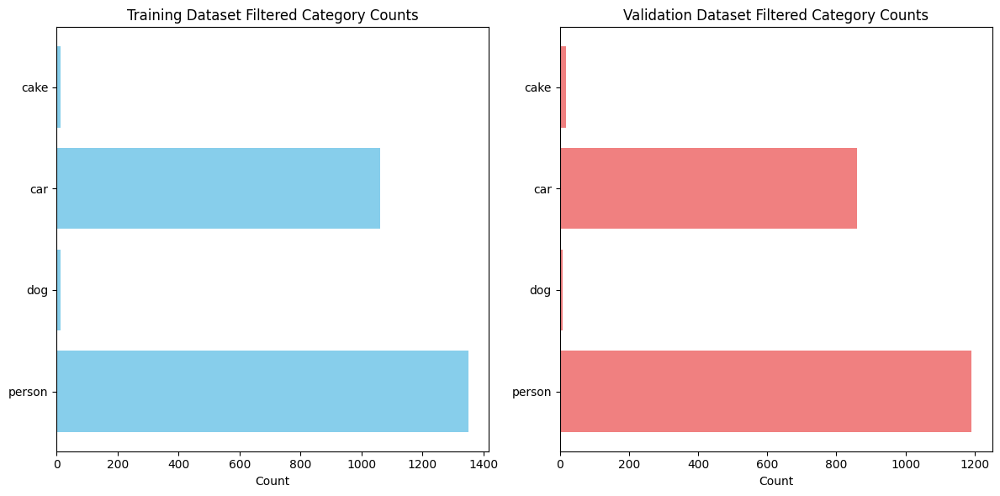

In [8]:
# Create horizontal bar plots for filtered category counts

plt.figure(figsize=(12, 6))

# Plot for Training Data
plt.subplot(1, 2, 1)
plt.barh(df_train_filtered['Category'], df_train_filtered['Count'], color='skyblue')
plt.xlabel('Count')
plt.title('Training Dataset Filtered Category Counts')
plt.gca().invert_yaxis() # Invert y-axis to have the category with the highest count at the top

# Plot for Validation Data
plt.subplot(1, 2, 2)
plt.barh(df_val_filtered['Category'], df_val_filtered['Count'], color='lightcoral')
plt.xlabel('Count')
plt.title('Validation Dataset Filtered Category Counts')
plt.gca().invert_yaxis() # Invert y-axis

plt.tight_layout()
plt.show()

In [9]:
# Number of training images containing the target classes with repetitions
target_classes = ["cake", "car", "dog", "person"]
train_target_classes_IDs = coco_train.getCatIds(catNms=target_classes)
training_images = []

# Iterate over each individual class in the list.
for class_name in target_classes:
    # Get all images containing target class.
    training_images_categories = coco_train.getCatIds(catNms=class_name)
    training_images_IDs = coco_train.getImgIds(catIds=training_images_categories)
    training_images += coco_train.loadImgs(training_images_IDs)

print(
    f"Category IDs of target classes in the validation set: {train_target_classes_IDs}.\nNumber of training images with target classes including repetitions: {len(training_images)}."
)

# Filter out repeated training images.

unique_training_images = []

for i in range(len(training_images)):
    if training_images[i] not in unique_training_images:
        unique_training_images.append(training_images[i])

# Shuffle the training data.
random.seed(0)
random.shuffle(unique_training_images)

print(
    f"Number of unique images in training data containing the target classes: {len(unique_training_images)}"
)


Category IDs of target classes in the validation set: [15, 16, 25, 41].
Number of training images with target classes including repetitions: 566.
Number of unique images in training data containing the target classes: 300


In [10]:
target_classes = ["cake", "car", "dog", "person"]
val_target_classes_IDs = coco_val.getCatIds(catNms=target_classes)
val_images = []

# Iterate over each individual class in the list.
for class_name in target_classes:
    # Get all images containing target class.
    val_images_categories = coco_val.getCatIds(catNms=class_name)
    val_images_IDs = coco_val.getImgIds(catIds=val_images_categories)
    val_images += coco_val.loadImgs(val_images_IDs)

print(
    f"Category IDs of target classes in the validation set: {val_target_classes_IDs}.\nNumber of validation images with target classes including repetitions: {len(val_images)}."
)

# Filter out repeated images.

unique_val_images = []

for i in range(len(val_images)):
    if val_images[i] not in unique_val_images:
        unique_val_images.append(val_images[i])

# Shuffle the training data.
random.seed(0)
random.shuffle(unique_training_images)

print(
    f"Number of unique images in validation data containing the target classes: {len(unique_val_images)}"
)


Category IDs of target classes in the validation set: [14, 15, 24, 41].
Number of validation images with target classes including repetitions: 474.
Number of unique images in validation data containing the target classes: 300


Sample training images:
Image ID: 138, File Name: 000000010318.jpg
[{'id': 1949, 'image_id': 138, 'category_id': 16, 'bbox': [563.34, 187.01, 31.490000000000002, 18.33], 'segmentation': [[582.0, 204.5, 563.0, 204.5, 566.5, 190.0, 584.0, 186.5, 591.0, 191.5, 593.5, 198.0, 582.0, 204.5]], 'area': 577.2117, 'iscrowd': 0, 'supercategory': 'vehicle'}, {'id': 1950, 'image_id': 138, 'category_id': 16, 'bbox': [600.68, 185.05, 28.9, 17.83], 'segmentation': [[618.0, 201.5, 612.0, 198.5, 604.0, 198.5, 602.0, 201.5, 599.5, 199.0, 601.5, 187.0, 619.0, 184.5, 625.0, 187.5, 628.5, 193.0, 627.5, 198.0, 618.0, 201.5]], 'area': 515.2869999999999, 'iscrowd': 0, 'supercategory': 'vehicle'}, {'id': 1951, 'image_id': 138, 'category_id': 16, 'bbox': [536.9, 188.76, 29.57, 20.11], 'segmentation': [[552.0, 207.5, 535.5, 203.0, 535.5, 195.0, 545.0, 187.5, 558.0, 187.5, 565.5, 193.0, 563.5, 201.0, 552.0, 207.5]], 'area': 594.6527, 'iscrowd': 0, 'supercategory': 'vehicle'}, {'id': 1952, 'image_id': 138, 'categor

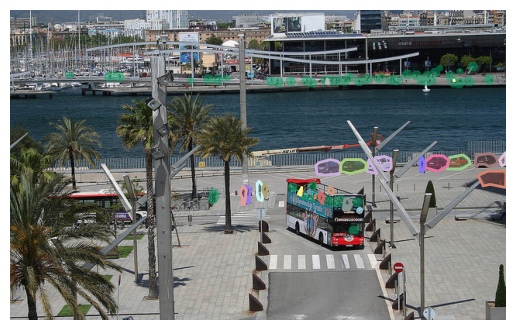

Image ID: 47, File Name: 000000003830.jpg
[{'id': 553, 'image_id': 47, 'category_id': 16, 'bbox': [265.24, 270.6, 111.74000000000001, 46.27], 'segmentation': [[320.0, 315.5, 266.0, 305.5, 264.5, 292.0, 275.5, 283.0, 278.0, 275.5, 318.0, 269.5, 348.0, 269.5, 354.5, 272.0, 375.5, 303.0, 372.0, 309.5, 337.0, 311.5, 320.0, 315.5]], 'area': 5170.2098000000005, 'iscrowd': 0, 'supercategory': 'vehicle'}, {'id': 554, 'image_id': 47, 'category_id': 16, 'bbox': [143.89, 267.57, 91.42, 56.34], 'segmentation': [[163.0, 321.5, 162.0, 312.5, 155.0, 311.5, 149.0, 318.5, 142.5, 313.0, 145.5, 286.0, 160.0, 266.5, 216.0, 267.5, 234.5, 293.0, 233.5, 300.0, 226.0, 303.5, 221.5, 313.0, 216.0, 316.5, 212.0, 309.5, 206.0, 309.5, 167.0, 314.5, 163.0, 321.5]], 'area': 5150.602800000001, 'iscrowd': 0, 'supercategory': 'vehicle'}, {'id': 555, 'image_id': 47, 'category_id': 16, 'bbox': [119.96, 272.2, 33.77, 30.81], 'segmentation': [[126.0, 302.5, 121.5, 299.0, 118.5, 283.0, 120.5, 276.0, 128.0, 272.5, 151.0, 272

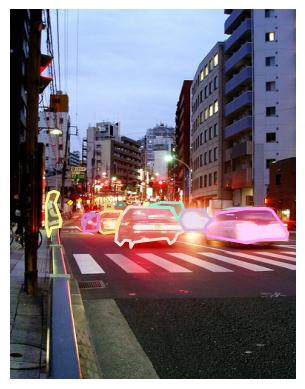

Image ID: 200, File Name: 000000013720.jpg
[{'id': 2803, 'image_id': 200, 'category_id': 16, 'bbox': [567.64, 117.62, 72.36, 98.14], 'segmentation': [[608.0, 214.5, 601.0, 214.5, 597.5, 211.0, 594.5, 204.0, 595.5, 188.0, 580.0, 180.5, 576.5, 163.0, 567.0, 162.5, 566.5, 160.0, 583.5, 146.0, 605.0, 116.5, 636.0, 120.5, 638.5, 122.0, 638.5, 197.0, 617.0, 197.5, 608.0, 214.5]], 'area': 7101.4104, 'iscrowd': 0, 'supercategory': 'vehicle'}, {'id': 2805, 'image_id': 200, 'category_id': 41, 'bbox': [236.02, 121.77999999999999, 16.64, 44.2], 'segmentation': [[246.0, 164.5, 240.5, 163.0, 240.5, 144.0, 235.5, 137.0, 241.5, 128.0, 242.0, 120.5, 248.5, 127.0, 251.5, 140.0, 249.5, 160.0, 246.0, 164.5]], 'area': 735.488, 'iscrowd': 0, 'supercategory': 'person'}]


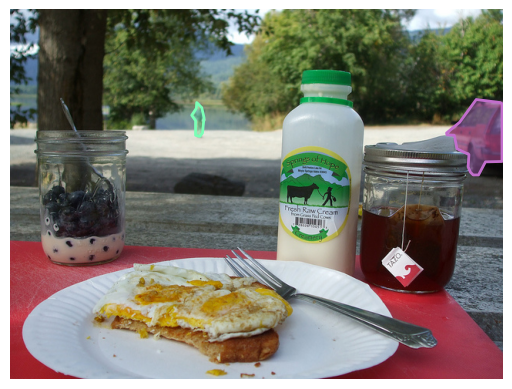

Image ID: 158, File Name: 000000011402.jpg
[{'id': 2193, 'image_id': 158, 'category_id': 16, 'bbox': [285.4, 194.74, 23.83, 18.56], 'segmentation': [[299.0, 212.5, 294.0, 212.5, 284.5, 204.0, 286.0, 194.5, 298.0, 193.5, 302.5, 197.0, 299.0, 212.5], [308.0, 210.5, 307.0, 205.5, 308.0, 210.5]], 'area': 442.28479999999996, 'iscrowd': 0, 'supercategory': 'vehicle'}, {'id': 2194, 'image_id': 158, 'category_id': 16, 'bbox': [373.03, 240.85000000000002, 30.55, 30.32], 'segmentation': [[398.0, 270.5, 385.0, 270.5, 375.5, 260.0, 372.5, 250.0, 375.0, 240.5, 389.0, 239.5, 399.5, 250.0, 401.5, 268.0, 398.0, 270.5]], 'area': 926.2760000000001, 'iscrowd': 0, 'supercategory': 'vehicle'}, {'id': 2195, 'image_id': 158, 'category_id': 16, 'bbox': [411.6, 283.21, 15.4, 22.98], 'segmentation': [[426.0, 305.5, 422.0, 305.5, 410.5, 293.0, 415.0, 284.5, 423.0, 282.5, 426.5, 286.0, 426.0, 305.5]], 'area': 353.892, 'iscrowd': 0, 'supercategory': 'vehicle'}, {'id': 2196, 'image_id': 158, 'category_id': 16, 'bbo

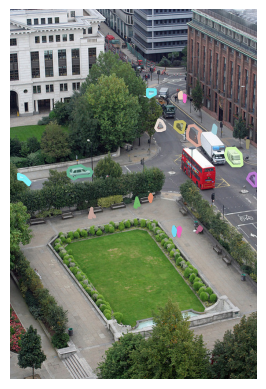

Image ID: 248, File Name: 000000016599.jpg
[{'id': 3374, 'image_id': 248, 'category_id': 16, 'bbox': [32.95, 519.85, 81.38, 49.45], 'segmentation': [[91.0, 568.5, 80.5, 567.0, 81.5, 550.0, 75.0, 533.5, 41.0, 532.5, 36.0, 537.5, 31.5, 534.0, 55.0, 518.5, 109.0, 522.5, 113.5, 527.0, 107.5, 533.0, 111.5, 549.0, 97.0, 567.5, 91.0, 568.5]], 'area': 4024.241, 'iscrowd': 0, 'supercategory': 'vehicle'}, {'id': 3375, 'image_id': 248, 'category_id': 41, 'bbox': [85.85, 528.03, 47.3, 76.37], 'segmentation': [[105.0, 603.5, 85.5, 602.0, 98.5, 596.0, 95.5, 575.0, 109.5, 550.0, 109.5, 544.0, 104.5, 537.0, 108.0, 531.5, 116.0, 527.5, 131.5, 551.0, 132.5, 562.0, 129.0, 573.5, 109.5, 578.0, 105.0, 603.5]], 'area': 3612.301, 'iscrowd': 0, 'supercategory': 'person'}, {'id': 3376, 'image_id': 248, 'category_id': 41, 'bbox': [126.92, 533.28, 31.589999999999996, 75.72], 'segmentation': [[146.0, 608.5, 138.5, 607.0, 141.5, 599.0, 140.0, 582.5, 133.5, 599.0, 133.5, 607.0, 125.5, 606.0, 129.5, 594.0, 131.5, 56

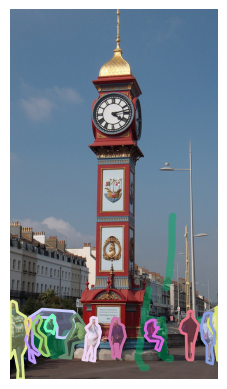

In [11]:
# Sample view of training images with target classes
# Print 5 images from the training data.
random.seed(0)
print("Sample training images:")
for i in range(5):
    img_info = random.choice(unique_training_images)
    print(f"Image ID: {img_info['id']}, File Name: {img_info['file_name']}")
    img_path = os.path.join(train_data_path, 'data', img_info['file_name'])
    if os.path.exists(img_path):
        I = io.imread(img_path)
        train_image_annotations_ID = coco_train.getAnnIds(
            imgIds=img_info["id"], catIds=train_target_classes_IDs, iscrowd=None)
        train_image_annotation = coco_train.loadAnns(train_image_annotations_ID)
        print(train_image_annotation)
        plt.imshow(I)
        plt.axis('off')
        coco_train.showAnns(train_image_annotation)
        plt.show()
    else:
        print(f"Image file not found: {img_path}")

Sample validation images:
Image ID: 248, File Name: 000000211674.jpg
[{'id': 3147, 'image_id': 248, 'category_id': 15, 'bbox': [184.88, 259.04, 14.71, 9.53], 'segmentation': [[185.0, 267.5, 183.5, 262.0, 187.0, 258.5, 194.0, 258.5, 198.5, 263.0, 197.0, 266.5, 185.0, 267.5]], 'area': 140.1863, 'iscrowd': 0, 'supercategory': 'vehicle'}, {'id': 3149, 'image_id': 248, 'category_id': 41, 'bbox': [284.09, 44.75, 33.69, 40.62], 'segmentation': [[300.0, 84.5, 286.5, 74.0, 283.5, 50.0, 288.0, 47.5, 292.0, 53.5, 298.0, 44.5, 302.0, 43.5, 308.5, 49.0, 310.5, 59.0, 315.5, 65.0, 300.0, 84.5]], 'area': 1368.4877999999999, 'iscrowd': 0, 'supercategory': 'person'}, {'id': 3150, 'image_id': 248, 'category_id': 41, 'bbox': [86.43, 251.98999999999998, 5.25, 13.68], 'segmentation': [[88.0, 264.5, 85.5, 256.0, 90.0, 250.5, 88.0, 264.5]], 'area': 71.82, 'iscrowd': 0, 'supercategory': 'person'}, {'id': 3152, 'image_id': 248, 'category_id': 41, 'bbox': [376.96, 11.12, 40.8, 33.95], 'segmentation': [[415.0, 44

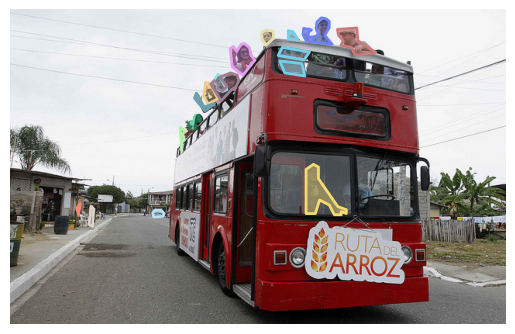

Image ID: 268, File Name: 000000228942.jpg
[{'id': 3389, 'image_id': 268, 'category_id': 15, 'bbox': [539.07, 124.51, 100.93, 110.40000000000002], 'segmentation': [[639.0, 233.5, 548.0, 221.5, 542.5, 212.0, 542.5, 189.0, 538.5, 172.0, 547.5, 154.0, 601.0, 143.5, 639.0, 123.5, 639.0, 233.5]], 'area': 11142.672000000002, 'iscrowd': 0, 'supercategory': 'vehicle'}, {'id': 3390, 'image_id': 268, 'category_id': 15, 'bbox': [0.94, 133.06, 379.93, 165.43], 'segmentation': [[213.0, 297.5, 191.0, 297.5, 168.0, 285.5, 155.0, 269.5, 55.0, 246.5, 43.0, 264.5, 21.0, 259.5, 11.5, 240.0, 0, 230.0, 0, 180.0, 8.0, 170.5, 28.0, 164.5, 68.0, 141.5, 125.0, 132.5, 212.0, 136.5, 263.0, 165.5, 270.0, 164.5, 278.0, 177.5, 318.0, 183.5, 366.0, 201.5, 379.5, 226.0, 375.5, 251.0, 372.0, 256.5, 308.0, 276.5, 262.0, 284.5, 236.0, 282.5, 213.0, 297.5]], 'area': 62851.8199, 'iscrowd': 0, 'supercategory': 'vehicle'}, {'id': 3393, 'image_id': 268, 'category_id': 41, 'bbox': [542.98, 121.07, 16.91, 36.44], 'segmentation

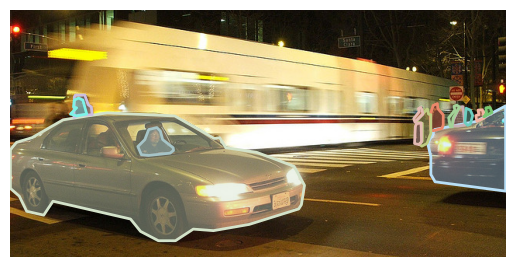

Image ID: 21, File Name: 000000018837.jpg
[{'id': 167, 'image_id': 21, 'category_id': 41, 'bbox': [327.57, 14.59, 139.46, 143.79], 'segmentation': [[465.0, 157.5, 447.0, 157.5, 434.5, 140.0, 410.5, 120.0, 402.0, 104.5, 379.0, 99.5, 361.0, 101.5, 356.0, 113.5, 343.5, 108.0, 326.5, 73.0, 338.5, 49.0, 364.0, 13.5, 375.0, 13.5, 377.5, 16.0, 376.5, 42.0, 390.5, 53.0, 393.5, 75.0, 397.5, 78.0, 400.5, 89.0, 437.0, 123.5, 452.5, 124.0, 454.5, 144.0, 465.0, 157.5]], 'area': 20052.9534, 'iscrowd': 0, 'supercategory': 'person'}, {'id': 168, 'image_id': 21, 'category_id': 41, 'bbox': [294.3, 21.62, 48.17, 101.51], 'segmentation': [[339.0, 122.5, 311.0, 118.5, 305.5, 107.0, 293.5, 98.0, 309.5, 62.0, 316.5, 56.0, 316.0, 53.5, 310.5, 55.0, 299.5, 41.0, 296.5, 31.0, 299.0, 27.5, 308.0, 28.5, 308.5, 23.0, 312.0, 20.5, 329.0, 25.5, 329.5, 32.0, 341.5, 44.0, 335.5, 46.0, 337.5, 50.0, 327.5, 74.0, 341.5, 102.0, 339.0, 122.5]], 'area': 4889.7367, 'iscrowd': 0, 'supercategory': 'person'}, {'id': 169, 'image

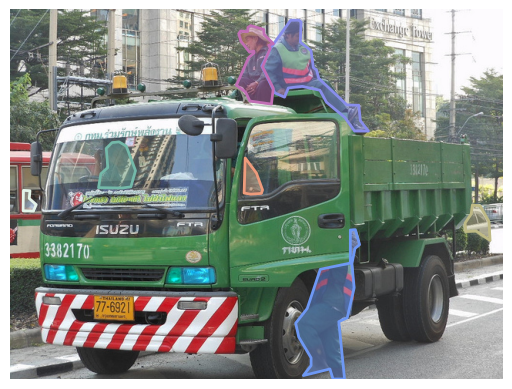

Image ID: 164, File Name: 000000147223.jpg
[{'id': 1972, 'image_id': 164, 'category_id': 15, 'bbox': [1.55, 156.34, 148.19, 137.32], 'segmentation': [[4.0, 291.5, 0.5, 291.0, 1.0, 156.5, 56.0, 157.5, 81.0, 170.5, 105.0, 196.5, 131.5, 198.0, 145.5, 221.0, 148.5, 232.0, 142.5, 243.0, 145.5, 250.0, 138.5, 258.0, 137.5, 269.0, 132.0, 274.5, 114.0, 274.5, 105.0, 268.5, 4.0, 291.5]], 'area': 20349.4508, 'iscrowd': 0, 'supercategory': 'vehicle'}, {'id': 1973, 'image_id': 164, 'category_id': 15, 'bbox': [42.68, 141.86, 115.16999999999999, 57.989999999999995], 'segmentation': [[141.0, 198.5, 117.0, 198.5, 108.0, 195.5, 98.5, 185.0, 93.5, 174.0, 83.0, 166.5, 62.0, 156.5, 41.5, 153.0, 65.0, 144.5, 112.0, 140.5, 142.0, 145.5, 152.5, 156.0, 156.5, 179.0, 153.5, 190.0, 141.0, 198.5]], 'area': 6678.708299999998, 'iscrowd': 0, 'supercategory': 'vehicle'}, {'id': 1975, 'image_id': 164, 'category_id': 15, 'bbox': [583.42, 103.79000000000002, 12.04, 26.83], 'segmentation': [[584.0, 129.5, 583.0, 102.5, 5

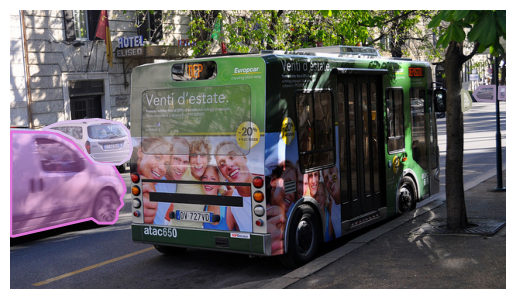

Image ID: 121, File Name: 000000114884.jpg
[{'id': 1362, 'image_id': 121, 'category_id': 41, 'bbox': [319.39, 85.76, 167.83, 239.54], 'segmentation': [[459.0, 324.5, 390.0, 324.5, 389.5, 306.0, 396.5, 272.0, 390.0, 264.5, 383.5, 265.0, 386.5, 271.0, 381.0, 274.5, 368.0, 275.5, 361.0, 269.5, 355.0, 275.5, 346.0, 278.5, 338.0, 289.5, 323.0, 283.5, 319.5, 277.0, 330.0, 261.5, 351.5, 259.0, 373.5, 228.0, 396.5, 206.0, 415.5, 180.0, 419.5, 164.0, 412.5, 148.0, 403.5, 140.0, 403.5, 115.0, 408.5, 95.0, 423.0, 84.5, 460.5, 92.0, 467.5, 103.0, 486.5, 167.0, 482.5, 232.0, 471.5, 251.0, 465.5, 269.0, 463.5, 296.0, 456.5, 313.0, 459.0, 324.5]], 'area': 40201.9982, 'iscrowd': 0, 'supercategory': 'person'}, {'id': 1363, 'image_id': 121, 'category_id': 41, 'bbox': [371.01, 104.69, 19.76, 47.22999999999999], 'segmentation': [[379.0, 150.5, 372.5, 149.0, 375.5, 144.0, 370.5, 127.0, 373.0, 103.5, 378.5, 104.0, 378.0, 111.5, 381.0, 110.5, 389.5, 116.0, 380.5, 124.0, 380.5, 138.0, 385.5, 144.0, 383.0, 146

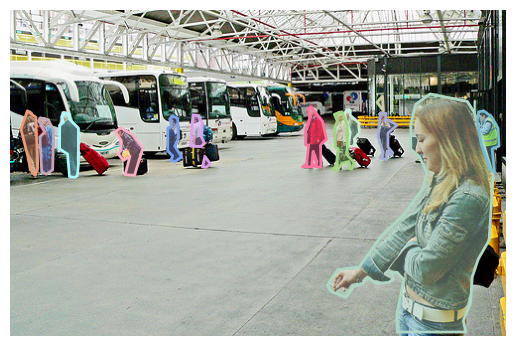

In [12]:
# Sample view of validation images with target classes
# Print 5 images from the validation data.
random.seed(0)
print("Sample validation images:")
for i in range(5):
    val_img_info = random.choice(unique_val_images)
    print(f"Image ID: {val_img_info['id']}, File Name: {val_img_info['file_name']}")
    img_path = os.path.join(val_data_path, 'data', val_img_info['file_name'])
    if os.path.exists(img_path):
        I = io.imread(img_path)
        val_image_annotations_ID = coco_val.getAnnIds(
            imgIds=val_img_info["id"], catIds=val_target_classes_IDs, iscrowd=None)
        val_image_annotation = coco_val.loadAnns(val_image_annotations_ID)
        print(val_image_annotation)
        plt.imshow(I)
        plt.axis('off')
        coco_val.showAnns(val_image_annotation)
        plt.show()
    else:
        print(f"Image file not found: {img_path}")

{'id': 34, 'file_name': '000000002782.jpg', 'height': 480, 'width': 640, 'license': None, 'coco_url': None}


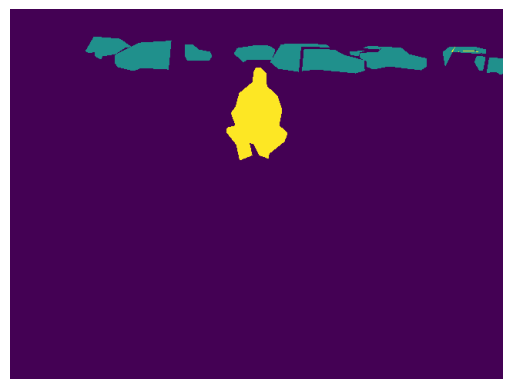

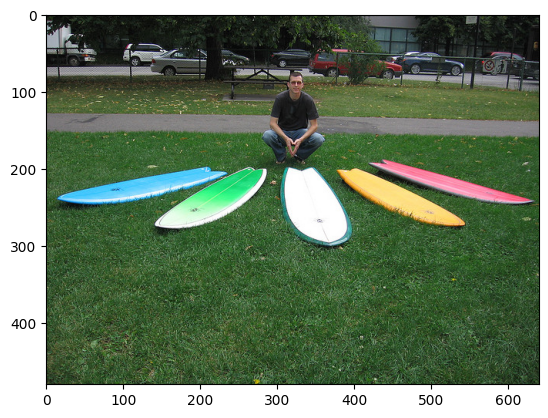

In [13]:
# Example of masking and displaying the mask on the image
training_image = unique_training_images[2]
print(training_image)

image = io.imread(f'{train_data_path}/data/{training_image["file_name"]}')
plt.axis("off")
plt.imshow(image)

cat_ids = coco_train.getCatIds(catNms=['car', 'dog', 'person', 'cake'])
anns_ids = coco_train.getAnnIds(imgIds=training_image['id'], catIds=cat_ids, iscrowd=None)
anns = coco_train.loadAnns(anns_ids)
mask = coco_train.annToMask(anns[0])
for i in range(len(anns)):
    mask += coco_train.annToMask(anns[i])

plt.imshow(mask)

plt.figure()
plt.imshow(image)


Sample test images:
File Name: 000000001643.jpg


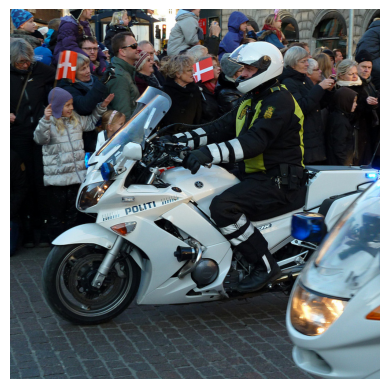

File Name: 000000001751.jpg


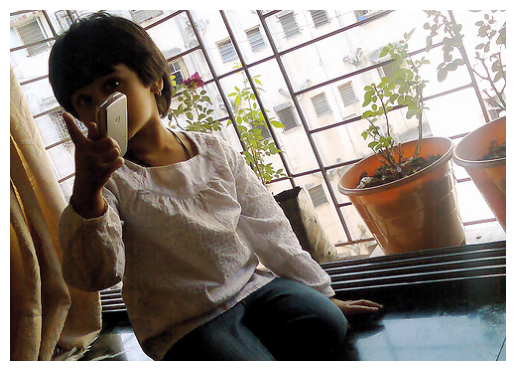

File Name: 000000001459.jpg


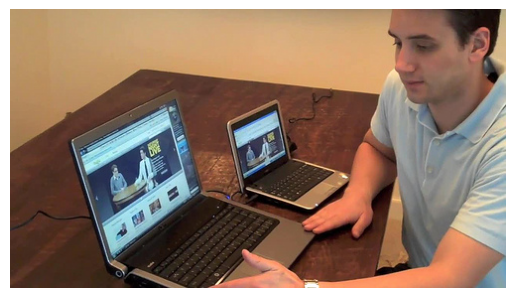

File Name: 000000001411.jpg


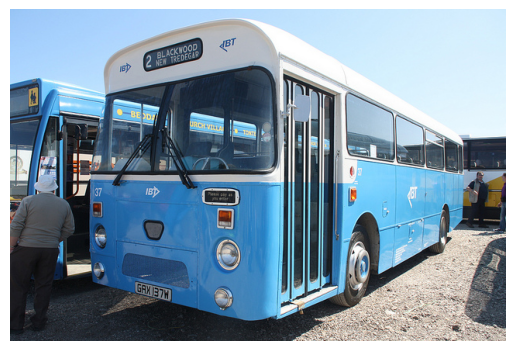

File Name: 000000001653.jpg


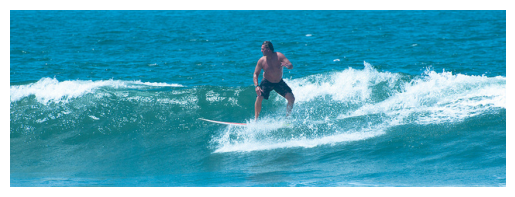

In [14]:
# Display test images
print("\nSample test images:")
# Get a list of all files in the test directory
test_image_files = [f for f in os.listdir(test_data_path) if f.lower().endswith(('.jpg', '.jpeg', '.png'))]

# Shuffle the list to pick random images
random.seed(0)
random.shuffle(test_image_files)

# Print and display 5 test images
for i in range(min(5, len(test_image_files))):
    test_img_file = test_image_files[i]
    test_img_path = os.path.join(test_data_path, test_img_file)
    print(f"File Name: {test_img_file}")
    if os.path.exists(test_img_path):
        I = io.imread(test_img_path)
        plt.imshow(I)
        plt.axis('off')
        plt.show()
    else:
        print(f"Test image file not found: {test_img_path}")

In [26]:
class DatasetPreprocessor:
    def __init__(self, coco_api, data_path, target_classes, image_size=(256, 256)):
        self.coco = coco_api
        self.data_path = data_path
        self.target_classes = target_classes
        self.image_size = image_size
        self.cat_ids = self.coco.getCatIds(catNms=self.target_classes)
        self.img_ids = self._get_image_ids_with_target_classes()
        self.images_info = self.coco.loadImgs(self.img_ids)

    def _get_image_ids_with_target_classes(self):
        """Gets image IDs that contain at least one of the target classes."""
        img_ids_with_target_classes = set()
        for cat_id in self.cat_ids:
            img_ids_with_target_classes.update(self.coco.getImgIds(catIds=cat_id))
        return list(img_ids_with_target_classes)

    def load_image(self, img_info):
        """Loads and resizes an image."""
        img_path = os.path.join(self.data_path, 'data', img_info['file_name'])
        image = io.imread(img_path)
        image = tf.image.resize(image, self.image_size)
        # Ensure image has 3 channels (handle grayscale images)
        if image.shape[-1] != 3:
             image = tf.image.grayscale_to_rgb(image)
        image = image / 255.0 # Normalize to [0, 1]
        return image

    def generate_masks(self, img_info):
        """Generates a separate mask for each target class in the image."""
        ann_ids = self.coco.getAnnIds(imgIds=img_info['id'], catIds=self.cat_ids, iscrowd=None)
        anns = self.coco.loadAnns(ann_ids)

        # Initialize a dictionary to store masks for each target category
        masks = {cat: np.zeros(self.image_size, dtype=np.float32) for cat in self.target_classes}

        for ann in anns:
            cat_info = self.coco.loadCats(ann['category_id'])[0]
            cat_name = cat_info['name']

            if cat_name in self.target_classes:
                # Generate mask for the current annotation
                mask = self.coco.annToMask(ann)
                # Resize the mask to the target image size
                mask = tf.image.resize(mask[..., np.newaxis], self.image_size, method='nearest')[..., 0]
                # Add this mask to the category-specific mask
                masks[cat_name] = np.maximum(masks[cat_name], mask.numpy())

        # Stack the category masks to create a multi-channel mask
        # The order of channels will correspond to the order of self.target_classes
        stacked_masks = np.stack([masks[cat] for cat in self.target_classes], axis=-1)

        return stacked_masks

    def get_dataset(self):
        """Generates image and multi-channel mask pairs."""
        # Define the output signature of the generator
        output_signature = (
            tf.TensorSpec(shape=(self.image_size[0], self.image_size[1], 3), dtype=tf.float32),
            tf.TensorSpec(shape=(self.image_size[0], self.image_size[1], len(self.target_classes)), dtype=tf.float32)
        )
        dataset = tf.data.Dataset.from_generator(
            self._data_generator,
            output_signature=output_signature # Use output_signature instead of output_types and output_shapes
        )
        return dataset

    def _data_generator(self):
        """Generator function to yield image and mask pairs."""
        for img_info in self.images_info:
            try:
                image = self.load_image(img_info)
                masks = self.generate_masks(img_info)
                yield image, masks # Yield single image and mask pair
            except Exception as e:
                print(f"Error processing image {img_info['file_name']}: {e}")
                continue

Image shape: (256, 256, 3)
Masks shape (channels per category): (256, 256, 4)


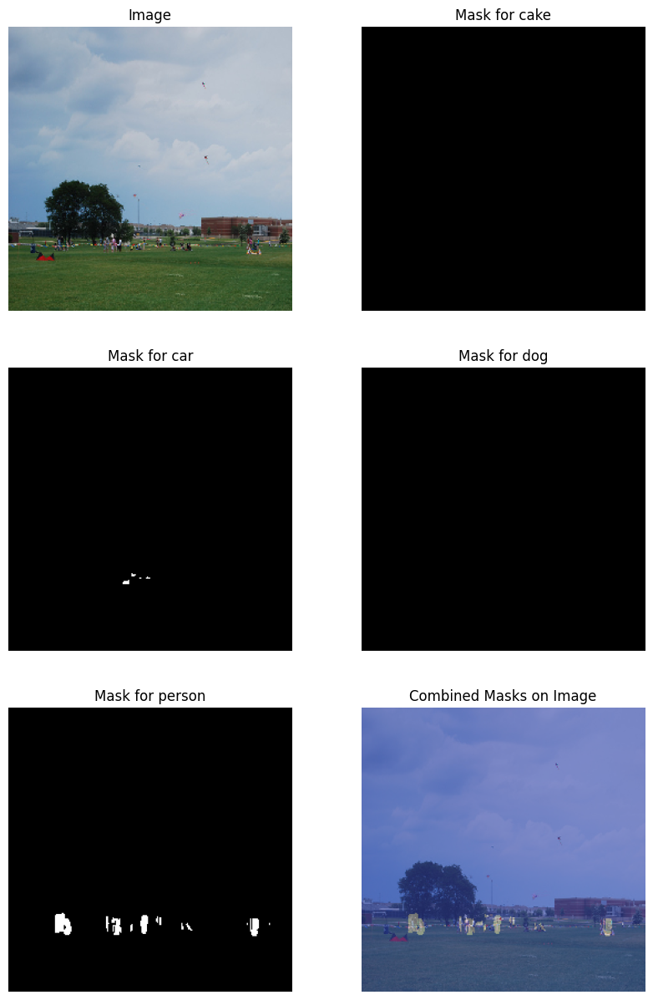

In [27]:
target_classes = ["cake", "car", "dog", "person"]
train_preprocessor = DatasetPreprocessor(coco_train, train_data_path, target_classes, image_size=(256, 256))
train_dataset = train_preprocessor.get_dataset()

val_preprocessor = DatasetPreprocessor(coco_val, val_data_path, target_classes, image_size=(256, 256))
val_dataset = val_preprocessor.get_dataset()
# You can now iterate through the datasets
for image, masks in train_dataset.take(1):
  print("Image shape:", image.shape)
  print("Masks shape (channels per category):", masks.shape)
  plt.figure(figsize=(10, 15))
  plt.subplot(3, 2, 1)
  plt.imshow(image.numpy())
  plt.title("Image")
  plt.axis('off')

  for j in range(len(target_classes)):
    plt.subplot(3, 2, j + 2)
    plt.imshow(masks[:, :, j], cmap='gray')
    plt.title(f"Mask for {target_classes[j]}")
    plt.axis('off')

  plt.subplot(3, 2, 6)
  # Display the combined mask segmented on the image
  plt.imshow(image.numpy()) # Display the original image first
  plt.imshow(np.sum(masks, axis=-1), cmap='coolwarm', alpha=0.5) # Overlay the combined mask with transparency
  plt.title("Combined Masks on Image")
  plt.axis('off')
  plt.show()

In [28]:
def convolutional_block(x, filters, kernel_size=3, padding='same', strides=1):
    x = Conv2D(filters, kernel_size, padding=padding, strides=strides, activation='relu')(x)
    x = Conv2D(filters, kernel_size, padding=padding, activation='relu')(x)
    return x

def encoder_block(x, filters):
    conv = convolutional_block(x, filters)
    pool = MaxPooling2D((2, 2))(conv)
    return conv, pool

def decoder_block(x, skip_features, filters):
    x = UpSampling2D((2, 2))(x)
    x = concatenate([x, skip_features])
    x = convolutional_block(x, filters)
    return x

def build_deeplab_unet(input_shape, num_classes):
    inputs = Input(input_shape)

    # Encoder
    conv1, pool1 = encoder_block(inputs, 64)
    conv2, pool2 = encoder_block(pool1, 128)
    conv3, pool3 = encoder_block(pool2, 256)
    conv4, pool4 = encoder_block(pool3, 512)

    # Bottleneck
    bottleneck = convolutional_block(pool4, 1024)

    # Decoder
    decoder1 = decoder_block(bottleneck, conv4, 512)
    decoder2 = decoder_block(decoder1, conv3, 256)
    decoder3 = decoder_block(decoder2, conv2, 128)
    decoder4 = decoder_block(decoder3, conv1, 64)

    # Output layer
    outputs = Conv2D(num_classes, 1, activation='sigmoid', padding='same')(decoder4)

    model = Model(inputs, outputs, name='DeeplabCombinedUNet')
    return model

# Define model parameters
IMAGE_HEIGHT = 256
IMAGE_WIDTH = 256
NUM_CLASSES = len(target_classes) # Number of target classes
INPUT_SHAPE = (IMAGE_HEIGHT, IMAGE_WIDTH, 3)

# Build the model
model = build_deeplab_unet(INPUT_SHAPE, NUM_CLASSES)

# Print model summary
model.summary()


Model: "DeeplabCombinedUNet"

┏━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┓
┃ Layer (type)        ┃ Output Shape      ┃    Param # ┃ Connected to      ┃
┡━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━┩
│ input_layer_1       │ (None, 256, 256,  │          0 │ -                 │
│ (InputLayer)        │ 3)                │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2d_19 (Conv2D)  │ (None, 256, 256,  │      1,792 │ input_layer_1[0]… │
│                     │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2d_20 (Conv2D)  │ (None, 256, 256,  │     36,928 │ conv2d_19[0][0]   │
│                     │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ max_pooling2d_4     │ (None, 128, 128,  │          0 │ conv2d_20[0][0]   │
│ (MaxPooling2D)      │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2d_21 (Conv2D)  │ (None, 128, 128,  │     73,856 │ max_pooling2d_4[… │
│                     │ 128)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2d_22 (Conv2D)  │ (None, 128, 128,  │    147,584 │ conv2d_21[0][0]   │
│                     │ 128)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ max_pooling2d_5     │ (None, 64, 64,    │          0 │ conv2d_22[0][0]   │
│ (MaxPooling2D)      │ 128)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2d_23 (Conv2D)  │ (None, 64, 64,    │    295,168 │ max_pooling2d_5[… │
│                     │ 256)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2d_24 (Conv2D)  │ (None, 64, 64,    │    590,080 │ conv2d_23[0][0]   │
│                     │ 256)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ max_pooling2d_6     │ (None, 32, 32,    │          0 │ conv2d_24[0][0]   │
│ (MaxPooling2D)      │ 256)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2d_25 (Conv2D)  │ (None, 32, 32,    │  1,180,160 │ max_pooling2d_6[… │
│                     │ 512)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2d_26 (Conv2D)  │ (None, 32, 32,    │  2,359,808 │ conv2d_25[0][0]   │
│                     │ 512)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ max_pooling2d_7     │ (None, 16, 16,    │          0 │ conv2d_26[0][0]   │
│ (MaxPooling2D)      │ 512)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2d_27 (Conv2D)  │ (None, 16, 16,    │  4,719,616 │ max_pooling2d_7[… │
│                     │ 1024)             │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2d_28 (Conv2D)  │ (None, 16, 16,    │  9,438,208 │ conv2d_27[0][0]   │
│                     │ 1024)             │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ up_sampling2d_4     │ (None, 32, 32,    │          0 │ conv2d_28[0][0]   │
│ (UpSampling2D)      │ 1024)             │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ concatenate_4       │ (None, 32, 32,    │          0 │ up_sampling2d_4[

 Total params: 31,379,140 (119.70 MB)

 Trainable params: 31,379,140 (119.70 MB)

 Non-trainable params: 0 (0.00 B)

In [29]:
# Configure the datasets for performance
BATCH_SIZE = 8 # You can adjust this based on your GPU memory

train_dataset = train_dataset.shuffle(buffer_size=100).batch(BATCH_SIZE).prefetch(buffer_size=tf.data.AUTOTUNE)
val_dataset = val_dataset.batch(BATCH_SIZE).prefetch(buffer_size=tf.data.AUTOTUNE)

# Define the loss function
# Since we have multi-channel output (one per class) and masks are binary (0 or 1)
# Binary Crossentropy for each pixel independently across all channels is suitable.
loss_function = tf.keras.losses.BinaryCrossentropy()

# Define the optimizer
optimizer = tf.keras.optimizers.Adam(learning_rate=1e-4)

# Define metrics
# We'll use Binary Accuracy for each class mask and a mean IoU.
metrics = [
    tf.keras.metrics.BinaryAccuracy(name='binary_accuracy'),
    tf.keras.metrics.MeanIoU(num_classes=2, name='mean_iou')
]


# Compile the model
model.compile(optimizer=optimizer, loss=loss_function, metrics=metrics)

In [30]:
history = model.fit(
    train_dataset,
    validation_data=val_dataset,
    epochs=50
)

Epoch 1/50
Error processing image 000000000821.jpg: 'images' must have either 3 or 4 dimensions.
Error processing image 000000005294.jpg: 'images' must have either 3 or 4 dimensions.
     38/Unknown 112s 1s/step - binary_accuracy: 0.8901 - loss: 0.4523 - mean_iou: 0.4832  

/usr/local/lib/python3.11/dist-packages/keras/src/trainers/epoch_iterator.py:151: UserWarning: Your input ran out of data; interrupting training. Make sure that your dataset or generator can generate at least `steps_per_epoch * epochs` batches. You may need to use the `.repeat()` function when building your dataset.
  self._interrupted_warning()


Error processing image 000000209222.jpg: 'images' must have either 3 or 4 dimensions.
38/38 ━━━━━━━━━━━━━━━━━━━━ 157s 3s/step - binary_accuracy: 0.8916 - loss: 0.4481 - mean_iou: 0.4832 - val_binary_accuracy: 0.9644 - val_loss: 0.1900 - val_mean_iou: 0.4822
Epoch 2/50
Error processing image 000000000821.jpg: 'images' must have either 3 or 4 dimensions.
Error processing image 000000005294.jpg: 'images' must have either 3 or 4 dimensions.
38/38 ━━━━━━━━━━━━━━━━━━━━ 0s 695ms/step - binary_accuracy: 0.9687 - loss: 0.1360 - mean_iou: 0.4844Error processing image 000000209222.jpg: 'images' must have either 3 or 4 dimensions.
38/38 ━━━━━━━━━━━━━━━━━━━━ 99s 1s/step - binary_accuracy: 0.9687 - loss: 0.1360 - mean_iou: 0.4844 - val_binary_accuracy: 0.9644 - val_loss: 0.1367 - val_mean_iou: 0.4822
Epoch 3/50
Error processing image 000000000821.jpg: 'images' must have either 3 or 4 dimensions.
Error processing image 000000005294.jpg: 'images' must have either 3 or 4 dimensions.
38/38 ━━━━━━━━━━━━━

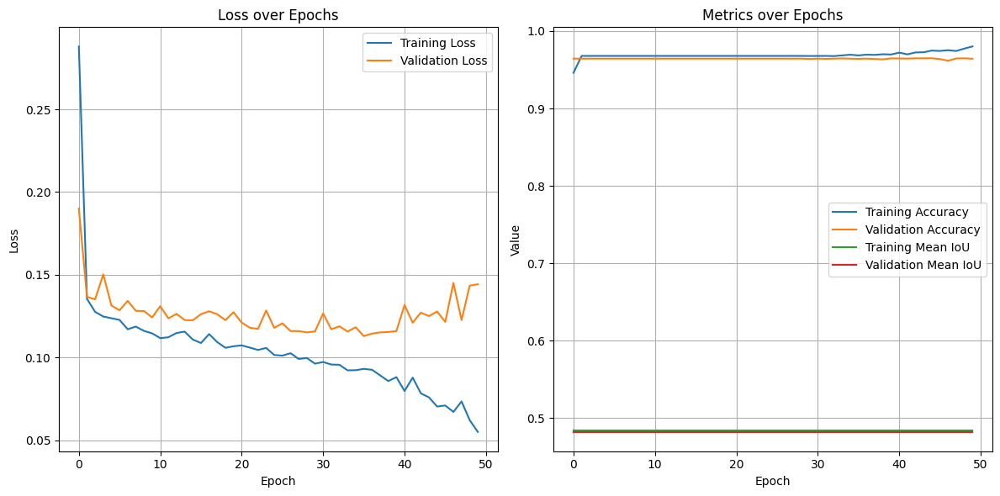

In [31]:
plt.figure(figsize=(12, 6))

# Plot Loss
plt.subplot(1, 2, 1)
plt.plot(history.history['loss'], label='Training Loss')
plt.plot(history.history['val_loss'], label='Validation Loss')
plt.title('Loss over Epochs')
plt.xlabel('Epoch')
plt.ylabel('Loss')
plt.legend()
plt.grid(True)

# Plot Metrics (e.g., Binary Accuracy and Mean IoU)
plt.subplot(1, 2, 2)
plt.plot(history.history['binary_accuracy'], label='Training Accuracy')
plt.plot(history.history['val_binary_accuracy'], label='Validation Accuracy')
plt.plot(history.history['mean_iou'], label='Training Mean IoU')
plt.plot(history.history['val_mean_iou'], label='Validation Mean IoU')
plt.title('Metrics over Epochs')
plt.xlabel('Epoch')
plt.ylabel('Value')
plt.legend()
plt.grid(True)

plt.tight_layout()
plt.show()

In [32]:
# Evaluating the Model on Validation Data
print("\nEvaluating model on validation data...")
loss, binary_accuracy, mean_iou = model.evaluate(val_dataset)

print(f"\nValidation Loss: {loss:.4f}")
print(f"Validation Binary Accuracy: {binary_accuracy:.4f}")
print(f"Validation Mean IoU: {mean_iou:.4f}")


Evaluating model on validation data...
     30/Unknown 13s 433ms/step - binary_accuracy: 0.9668 - loss: 0.1315 - mean_iou: 0.4834Error processing image 000000209222.jpg: 'images' must have either 3 or 4 dimensions.
38/38 ━━━━━━━━━━━━━━━━━━━━ 16s 427ms/step - binary_accuracy: 0.9663 - loss: 0.1335 - mean_iou: 0.4832

Validation Loss: 0.1443
Validation Binary Accuracy: 0.9643
Validation Mean IoU: 0.4822



Making predictions on sample test images:
1/1 ━━━━━━━━━━━━━━━━━━━━ 6s 6s/step


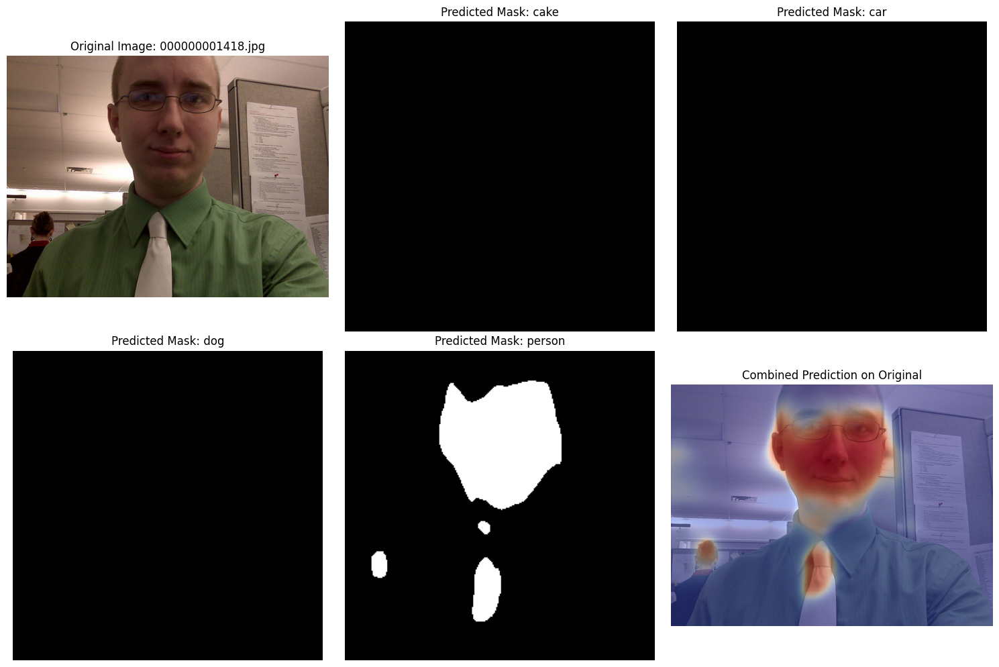

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 58ms/step


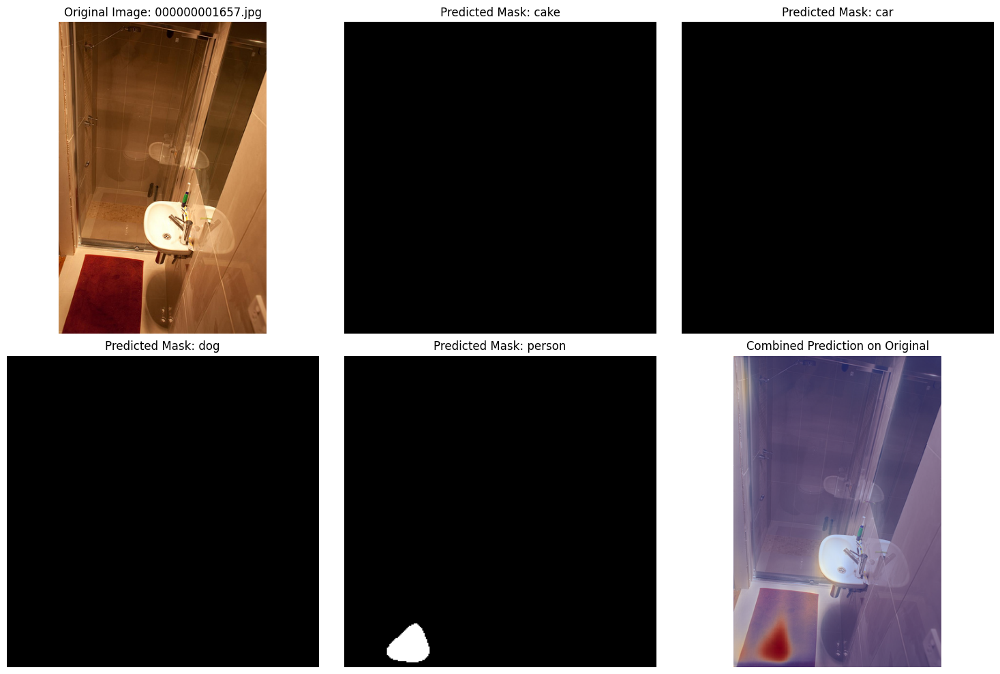

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 88ms/step


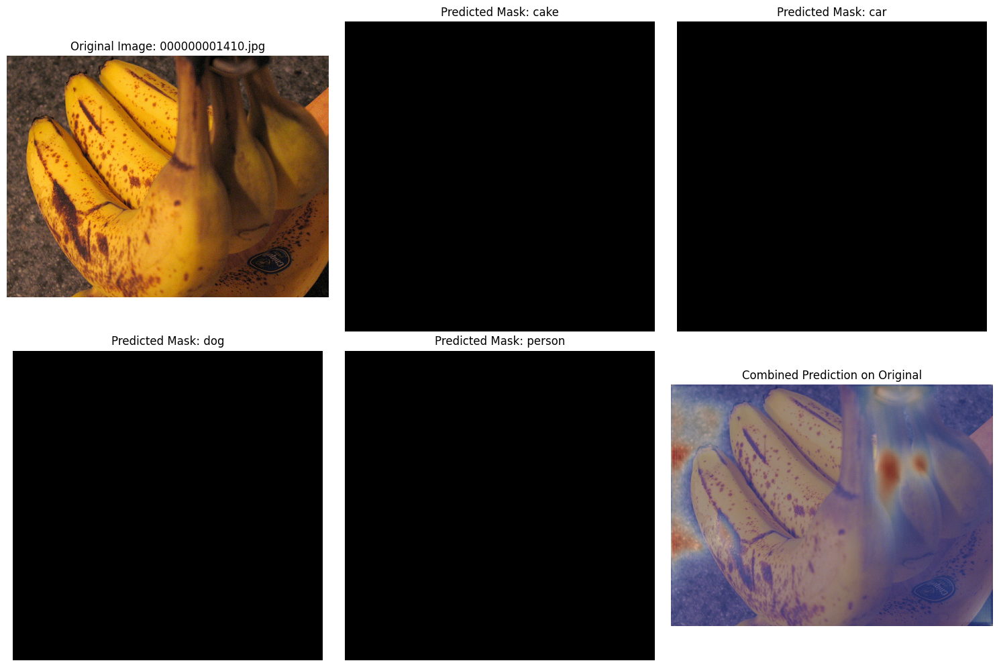

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 76ms/step


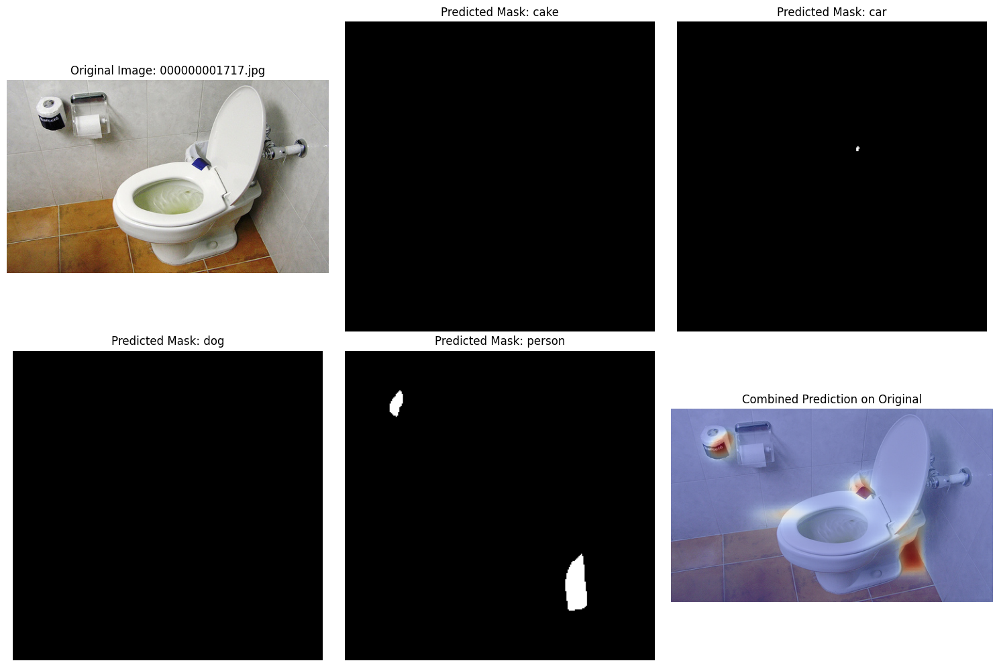

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 106ms/step


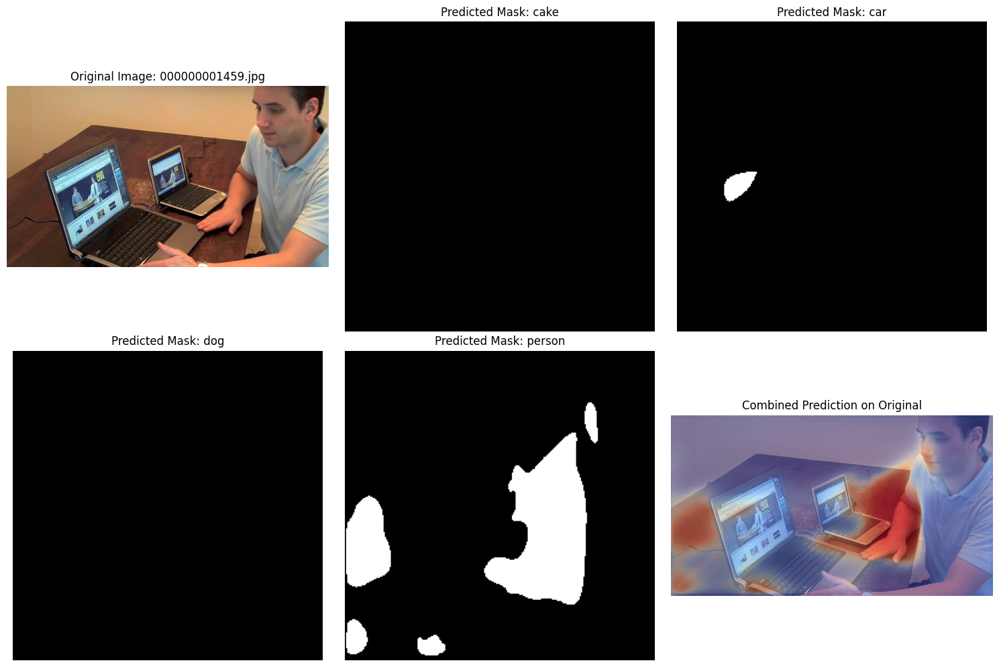

In [33]:
# Making Predictions on Test Data
# First, create a test dataset preprocessor
# We'll need to adapt the DatasetPreprocessor or create a new one for test data.
# For now, let's just load a few test images manually for demonstration.

def load_test_image(image_path, image_size=(256, 256)):
    """Loads and resizes a test image."""
    image = io.imread(image_path)
    image = tf.image.resize(image, image_size)
    if image.shape[-1] != 3:
         image = tf.image.grayscale_to_rgb(image)
    image = image / 255.0 # Normalize to [0, 1]
    return image

# Get a list of test image files
test_image_files = [f for f in os.listdir(test_data_path) if f.lower().endswith(('.jpg', '.jpeg', '.png'))]

# Select a few test images to predict on
sample_test_files = random.sample(test_image_files, min(5, len(test_image_files)))

print("\nMaking predictions on sample test images:")
for test_img_file in sample_test_files:
    test_img_path = os.path.join(test_data_path, test_img_file)

    if os.path.exists(test_img_path):
        # Load and preprocess the test image
        original_image = io.imread(test_img_path) # Load original for display
        input_image = load_test_image(test_img_path, image_size=(IMAGE_HEIGHT, IMAGE_WIDTH))
        input_image = tf.expand_dims(input_image, axis=0) # Add batch dimension

        # Make prediction
        predicted_masks = model.predict(input_image)[0] # Remove batch dimension

        # Visualizing Predictions
        plt.figure(figsize=(15, 10))

        # Original Image
        plt.subplot(2, 3, 1)
        plt.imshow(original_image)
        plt.title(f"Original Image: {test_img_file}")
        plt.axis('off')

        # Display predicted masks for each class
        for j in range(NUM_CLASSES):
            plt.subplot(2, 3, j + 2)
            # Threshold the mask for better visualization if needed
            threshold = 0.5 # You can adjust this
            binary_mask = (predicted_masks[:, :, j] > threshold).astype(np.float32)
            plt.imshow(binary_mask, cmap='gray')
            plt.title(f"Predicted Mask: {target_classes[j]}")
            plt.axis('off')

        # Display combined mask overlayed on original image (resized prediction)
        plt.subplot(2, 3, NUM_CLASSES + 2)
        # Resize the predicted masks to the original image size for overlay
        resized_predicted_masks = tf.image.resize(predicted_masks, (original_image.shape[0], original_image.shape[1]), method='nearest').numpy()
        combined_mask_overlay = np.sum(resized_predicted_masks, axis=-1)
        plt.imshow(original_image)
        plt.imshow(combined_mask_overlay, cmap='coolwarm', alpha=0.5) # Overlay the combined mask
        plt.title("Combined Prediction on Original")
        plt.axis('off')

        plt.tight_layout()
        plt.show()
    else:
        print(f"Test image file not found: {test_img_path}")